https://www.kaggle.com/ipbyrne/income-prediction-84-369-accuracy

## 1. Load Libaraies

First, we need to load all of our libraries we will use for this project.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from collections import Counter

from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve, train_test_split, KFold
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
import plotly.offline as py
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
import warnings
warnings.filterwarnings('ignore')

import pathlib
from mlxtend.evaluate import feature_importance_permutation
sns.set(style='white', context='notebook', palette='deep')
init_notebook_mode(connected=True)
cf.go_offline()

from sklearn.base import clone
import joblib

## 2. Load Data

Next, we load our data.

In [2]:
cwd = pathlib.Path.cwd()
dataset = pd.read_csv(cwd/'adult_dataset'/'adult.data', names = ['age','workclass','fnlwgt','education','education_num','marital_status','occupation','relationship','race','sex','capital_gain','capital_loss','hours_per_week','native_country','income'])

# Replace All Null Data in NaN
dataset = dataset.fillna(np.nan)

le= LabelEncoder()
dataset['income'] = le.fit_transform(dataset['income'])

# Identify Numeric features
numeric_features = ['age','fnlwgt','education_num','capital_gain','capital_loss','hours_per_week','income']

# Identify Categorical features
cat_features = ['workclass','education','marital_status', 'occupation', 'relationship', 'race', 'sex', 'native']

# Fill Missing Category Entries
dataset["workclass"] = dataset["workclass"].fillna("X")
dataset["occupation"] = dataset["occupation"].fillna("X")
dataset["native_country"] = dataset["native_country"].fillna("United-States")

# Create Married Column - Binary Yes(1) or No(0)
dataset["marital_status"] = dataset["marital_status"].replace([' Never-married',' Divorced',' Separated',' Widowed'], 'Single')
dataset["marital_status"] = dataset["marital_status"].replace([' Married-civ-spouse',' Married-spouse-absent',' Married-AF-spouse'], 'Married')

# dataset.drop(labels=["workclass","education","occupation","relationship","race","native_country"], axis = 1, inplace = True)
edu_map = dataset[['education','education_num']].drop_duplicates()
dataset.drop(labels=["education", 'capital_gain','capital_loss', 'native_country',"relationship"], axis = 1, inplace = True)

In [3]:
for col in dataset.select_dtypes('O').columns:
    print ("{}: {} unique values".format(col, len(dataset[col].unique())))

workclass: 9 unique values
marital_status: 2 unique values
occupation: 15 unique values
race: 5 unique values
sex: 2 unique values


In [4]:
sex_le = LabelEncoder()
dataset['sex'] = sex_le.fit_transform(dataset['sex'])
marital_le = LabelEncoder()
dataset['marital_status'] = marital_le.fit_transform(dataset['marital_status'])

In [5]:
X = dataset.drop(columns='income')
X = pd.get_dummies(X)
Y = dataset['income']

validation_size = 0.20
seed = 7
scoring = 'accuracy'
X_train, X_test, y_train, y_test = train_test_split(X,Y,
    test_size=validation_size,random_state=seed)

# Tuned Params for Random Forest
# num_trees = 250
# max_features = 5
num_trees = 100
max_features = 3

In [6]:
# Adding random feature
X_train['random'] = np.random.random(len(X_train))
X_test['random'] = np.random.random(len(X_test))

# RF

In [7]:
rf = RandomForestClassifier(n_estimators=250,max_features=5)
rf.fit(X_train, y_train)
predictions = rf.predict(X_test)
print("Accuracy: %s%%" % (100*accuracy_score(y_test, predictions)))
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

Accuracy: 83.34101028711807%
[[4548  403]
 [ 682  880]]
              precision    recall  f1-score   support

           0       0.87      0.92      0.89      4951
           1       0.69      0.56      0.62      1562

    accuracy                           0.83      6513
   macro avg       0.78      0.74      0.76      6513
weighted avg       0.83      0.83      0.83      6513



In [9]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 43.9min finished


RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    n_estimators='warn',
                                                    n_jobs=None

In [12]:
rf_params = rf_random.best_params_

In [14]:
rf = RandomForestClassifier(**rf_params)
rf.fit(X_train, y_train)
predictions = rf.predict(X_test)
print("Accuracy: %s%%" % (100*accuracy_score(y_test, predictions)))
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

Accuracy: 83.54061108552126%
[[4596  355]
 [ 717  845]]
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      4951
           1       0.70      0.54      0.61      1562

    accuracy                           0.84      6513
   macro avg       0.78      0.73      0.75      6513
weighted avg       0.83      0.84      0.83      6513



In [16]:
#Saving the model
joblib.dump(rf, "adult_rf_model.sav")

['adult_rf_model.sav']

In [7]:
#Loading the saved model
rf = joblib.load("adult_rf_model.sav")

## Feature Importances

### Mean Decrease Impurity

In [8]:
feat_imp = pd.DataFrame({'features': X_train.columns.tolist(), "mean_decrease_impurity": rf.feature_importances_}).sort_values('mean_decrease_impurity', ascending=False)
feat_imp = feat_imp.head(25)
feat_imp.iplot(kind='bar',
               y='mean_decrease_impurity',
               x='features',
               yTitle='Mean Decrease Impurity',
               xTitle='Features',
               title='Mean Decrease Impurity',
              )

In [9]:
# get the feature importances from each tree and then visualize the
# distributions as boxplots
all_feat_imp_df = pd.DataFrame(data=[tree.feature_importances_ for tree in 
                                     rf],
                               columns=X_train.columns)
order_column = all_feat_imp_df.mean(axis=0).sort_values(ascending=False).index.tolist()


all_feat_imp_df[order_column[:25]].iplot(kind='box', xTitle = 'Features', yTitle='Mean Decease Impurity')

### Permutation Importance

In [13]:
%%time
#This takes sometime. You can reduce this number to make the process faster
num_rounds = 50

imp_vals, all_trials = feature_importance_permutation(
    predict_method=rf.predict, 
    X=X_test.values,
    y=y_test.values,
    metric='accuracy',
    num_rounds=num_rounds, 
    seed=1)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.68 µs


In [21]:
joblib.dump(imp_vals, "adult_permutation_imp_vals.sav")
joblib.dump(all_trials, "adult_permutation_all_trials.sav")

['adult_permutation_all_trials.sav']

In [10]:
imp_vals = joblib.load("adult_permutation_imp_vals.sav")
all_trials = joblib.load("adult_permutation_all_trials.sav")

In [11]:
permutation_importance = pd.DataFrame({'features': X_train.columns.tolist(), "permutation_importance": imp_vals}).sort_values('permutation_importance', ascending=False)
permutation_importance = permutation_importance.head(25)
permutation_importance.iplot(kind='bar',
               y='permutation_importance',
               x='features',
               yTitle='Permutation Importance',
               xTitle='Features',
               title='Permutation Importances',
              )

In [14]:
# get the feature importances from each tree and then visualize the
# distributions as boxplots
all_feat_imp_df = pd.DataFrame(data=np.transpose(all_trials),
                                   columns=X_train.columns, index = range(0,num_rounds))
order_column = all_feat_imp_df.mean(axis=0).sort_values(ascending=False).index.tolist()

all_feat_imp_df[order_column[:25]].iplot(kind='box', xTitle = 'Features', yTitle='Permutation Importance')

In [15]:
from sklearn.model_selection import cross_val_score

### Drop Column Importance

In [16]:
# 
def dropcol_importances(rf, X_train, y_train, cv = 3):
    rf_ = clone(rf)
    rf_.random_state = 42
    baseline = cross_val_score(rf_, X_train, y_train, scoring='accuracy', cv=cv)
    imp = []
    for col in X_train.columns:
        X = X_train.drop(col, axis=1)
        rf_ = clone(rf)
        rf_.random_state = 42
        oob = cross_val_score(rf_, X, y_train, scoring='accuracy', cv=cv)
        imp.append(baseline - oob)
    imp = np.array(imp)
    
    importance = pd.DataFrame(
            imp, index=X_train.columns)
    importance.columns = ["cv_{}".format(i) for i in range(cv)]
    return importance

In [17]:
# Considering one-hot variables as one
def dropcol_importances_mixed(rf, X_train, y_train, cv = 3, one_hot_features =[]):
    rf_ = clone(rf)
    rf_.random_state = 42
    baseline = cross_val_score(rf_, X_train, y_train, scoring='accuracy', cv=cv)
    imp = []
    column_names = []
    one_hot_col_names = []
    for col in X_train.columns:
        for cat_col in one_hot_features:
            if cat_col in col:
                one_hot_col_names.append(col)
                break
        
    numerical_features = list(set(X_train.columns)-set(one_hot_col_names))
    # Removing numerical features one at a time
    for col in numerical_features:
        X = X_train.drop(col, axis=1)
        rf_ = clone(rf)
        rf_.random_state = 42
        oob = cross_val_score(rf_, X, y_train, scoring='accuracy', cv=cv)
        imp.append(baseline - oob)
        column_names.append(col)
    # Removing set of one_hot features at once
    for cat_col in one_hot_features:
        drop_cols = [col for col in X_train.columns if cat_col in col]
        X = X_train.drop(drop_cols, axis=1)
        rf_ = clone(rf)
        rf_.random_state = 42
        oob = cross_val_score(rf_, X, y_train, scoring='accuracy', cv=cv)
        imp.append(baseline - oob)
        column_names.append(cat_col)
    imp = np.array(imp)
    
    importance = pd.DataFrame(
            imp, index=column_names)
    importance.columns = ["cv_{}".format(i) for i in range(cv)]
    return importance

In [70]:
%%time
drop_col_imp = dropcol_importances_mixed(rf, X_train, y_train, cv=50, one_hot_features=['workclass','occupation','race'])

CPU times: user 48min 34s, sys: 3.36 s, total: 48min 38s
Wall time: 48min 38s


In [71]:
drop_col_importance = pd.DataFrame({'features': drop_col_imp.index.tolist(), "drop_col_importance": drop_col_imp.mean(axis=1).values}).sort_values('drop_col_importance', ascending=False)
drop_col_importance = drop_col_importance.head(25)
drop_col_importance.iplot(kind='bar',
               y='drop_col_importance',
               x='features',
               yTitle='Drop Column Importance',
               xTitle='Features',
               title='Drop Column Importances',
              )

In [72]:
all_feat_imp_df = drop_col_imp.T
order_column = all_feat_imp_df.mean(axis=0).sort_values(ascending=False).index.tolist()

all_feat_imp_df[order_column[:25]].iplot(kind='box', xTitle = 'Features', yTitle='Drop Column Importance')

In [51]:
%%time
drop_col_imp = dropcol_importances(rf, X_train, y_train, cv=50)

CPU times: user 2h 43min 47s, sys: 12.9 s, total: 2h 44min
Wall time: 2h 44min


In [47]:
joblib.dump(drop_col_imp, "adult_drop_col_all_trials.sav")

['adult_drop_col_all_trials.sav']

In [52]:
drop_col_importance = pd.DataFrame({'features': X_train.columns.tolist(), "drop_col_importance": drop_col_imp.mean(axis=1).values}).sort_values('drop_col_importance', ascending=False)
drop_col_importance = drop_col_importance.head(25)
drop_col_importance.iplot(kind='bar',
               y='drop_col_importance',
               x='features',
               yTitle='Drop Column Importance',
               xTitle='Features',
               title='Drop Column Importances',
              )

In [53]:
all_feat_imp_df = drop_col_imp.T
order_column = all_feat_imp_df.mean(axis=0).sort_values(ascending=False).index.tolist()

all_feat_imp_df[order_column[:25]].iplot(kind='box', xTitle = 'Features', yTitle='Drop Column Importance')

### Shapely Values and LIME

In [8]:
import shap

# load JS visualization code to notebook
shap.initjs()

In [55]:
le.classes_

array([' <=50K', ' >50K'], dtype=object)

In [ ]:
%%time
explainer = shap.TreeExplainer(model = rf, model_output='margin')
shap_values = explainer.shap_values(X_test)

In [ ]:
#Calculating the shap values takes a long itme
# Best to save it 
joblib.dump(explainer, "adult_tree_explainer.sav")
joblib.dump(shap_values, "adult_tree_explainer_shap_values.sav")

In [9]:
#Loading the saved files
explainer = joblib.load("adult_tree_explainer.sav")
shap_values = joblib.load("adult_tree_explainer_shap_values.sav")

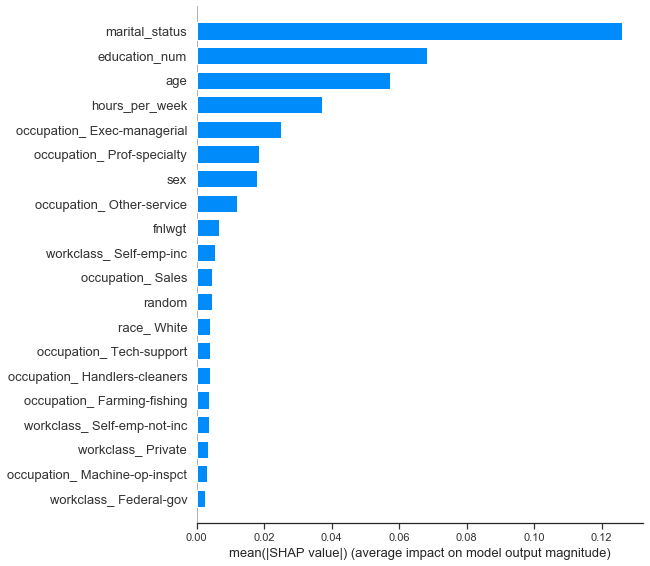

In [62]:
# summarize the effects of all the features
# can give a list of SHAP values also and it will display the importance for each feature and class as a stacked chart
# But, personally I find it less intuitive to interpret
shap.summary_plot(shap_values = shap_values[1], features = X_test, max_display=20, plot_type='bar')

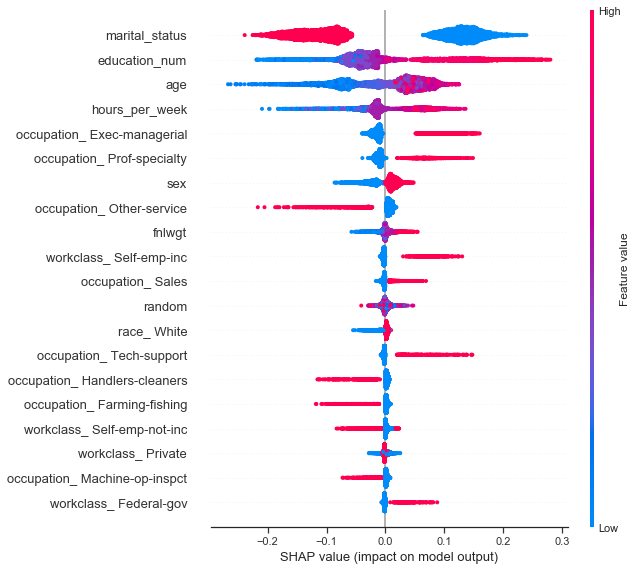

In [61]:
# summarize the effects of all the features
shap.summary_plot(shap_values = shap_values[1], features = X_test, max_display=20, plot_type='dot',class_names=le.classes_.tolist())

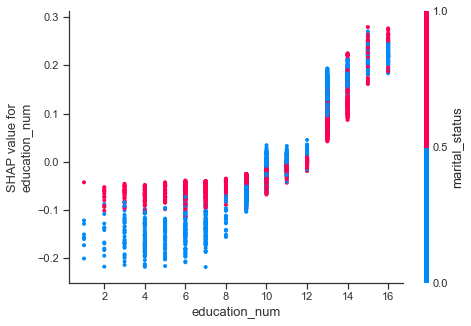

In [63]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("education_num", shap_values=shap_values[1], features=X_test)

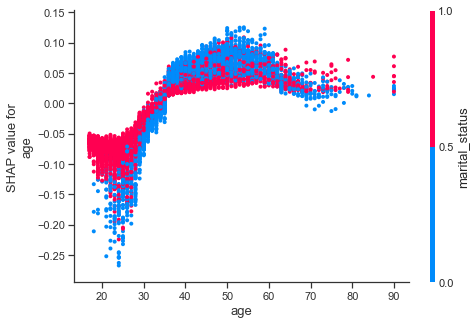

In [64]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("age", shap_values=shap_values[1], features=X_test)

## Individual Predictions

In [10]:
import lime
import lime.lime_tabular

In [11]:
# Creating the Lime Explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                        training_labels = y_train.values,
                                                   feature_names=X_train.columns.tolist(),
                                                        feature_selection='lasso_path',
                                                   class_names=['<50k', '>50k'], 
                                                  discretize_continuous=True,
                                                       discretizer='entropy')

In [12]:
edu_map = edu_map.set_index('education_num').to_dict()['education']

In [56]:
row = 345
d = X_test.iloc[row]
work_class_cols = [col for col in X_train.columns if 'workclass' in col]
occupation_cols = [col for col in X_train.columns if 'occupation' in col]
race_cols = [col for col in X_train.columns if 'race' in col]
one_hot_cols = work_class_cols+occupation_cols+race_cols
other_cols = list(set(X_train.columns) - set(one_hot_cols))

d = d[other_cols+d[d.index.isin(one_hot_cols) & (d>0)].index.tolist()]

d['education_num'] = edu_map[int(d['education_num'])]

d['marital_status'] =  marital_le.inverse_transform([int(d['marital_status'])])[0]
d['sex'] = sex_le.inverse_transform([int(d['sex'])])[0]

display(d)
pred = rf.predict(X_test.iloc[row].values.reshape(1,-1))[0]
print ("Label: {}".format(le.inverse_transform([int(y_test.iloc[row])])[0]))
print ("Prediction: {}".format(le.inverse_transform([pred])[0]))

sex                                  Male
education_num                   Bachelors
random                            0.47997
marital_status                    Married
fnlwgt                             167065
age                                    50
hours_per_week                         40
workclass_ Private                      1
occupation_ Exec-managerial             1
race_ White                             1
Name: 23706, dtype: object

Label:  >50K
Prediction:  >50K


In [36]:
shap.force_plot(base_value = explainer.expected_value[pred], shap_values = shap_values[pred][row], features=X_test.iloc[row], feature_names=X_test.columns,
                link='identity',out_names=le.inverse_transform([pred])[0])

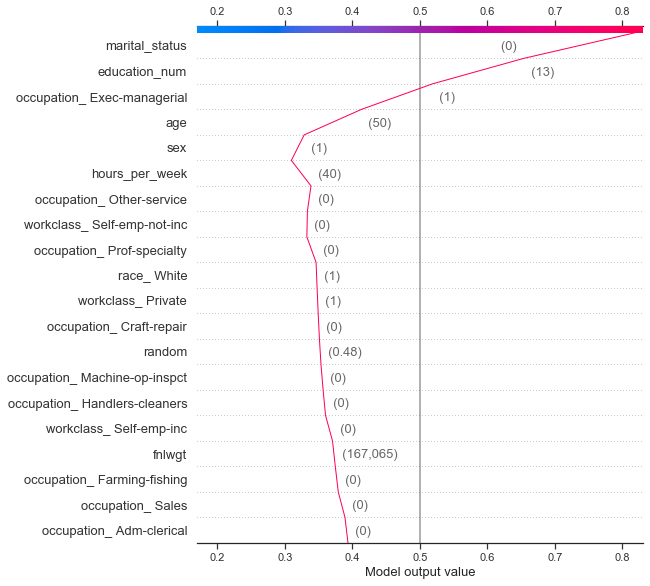

In [29]:
shap.decision_plot(base_value = explainer.expected_value[pred], shap_values=shap_values[pred][row], features = X_test.iloc[row], feature_names=X_test.columns.tolist(),
                link='identity', new_base_value=0.5)

In [16]:
exp = lime_explainer.explain_instance(X_test.iloc[row], rf.predict_proba, num_features=5)

exp.show_in_notebook(show_table=True)

In [37]:
row = 26
d = X_test.iloc[row]
work_class_cols = [col for col in X_train.columns if 'workclass' in col]
occupation_cols = [col for col in X_train.columns if 'occupation' in col]
race_cols = [col for col in X_train.columns if 'race' in col]
one_hot_cols = work_class_cols+occupation_cols+race_cols
other_cols = list(set(X_train.columns) - set(one_hot_cols))

d = d[other_cols+d[d.index.isin(one_hot_cols) & (d>0)].index.tolist()]

d['education_num'] = edu_map[int(d['education_num'])]

d['marital_status'] =  marital_le.inverse_transform([int(d['marital_status'])])[0]
d['sex'] = sex_le.inverse_transform([int(d['sex'])])[0]

display(d)
pred = rf.predict(X_test.iloc[row].values.reshape(1,-1))[0]
print ("Label: {}".format(le.inverse_transform([int(y_test.iloc[row])])[0]))
print ("Prediction: {}".format(le.inverse_transform([pred])[0]))

sex                            Male
education_num               HS-grad
random                     0.106008
marital_status              Married
fnlwgt                       199768
age                              57
hours_per_week                   30
workclass_ Self-emp-inc           1
occupation_ Sales                 1
race_ White                       1
Name: 20435, dtype: object

Label:  >50K
Prediction:  <=50K


In [289]:
# row = 876
# d = X_test.iloc[row]
# work_class_cols = [col for col in X_train.columns if 'workclass' in col]
# occupation_cols = [col for col in X_train.columns if 'occupation' in col]
# race_cols = [col for col in X_train.columns if 'race' in col]
# one_hot_cols = work_class_cols+occupation_cols+race_cols
# other_cols = list(set(X_train.columns) - set(one_hot_cols))

# d = d[other_cols+d[d.index.isin(one_hot_cols) & (d>0)].index.tolist()]

# d['education_num'] = edu_map[d['education_num']]

# d['marital_status'] =  marital_le.inverse_transform([int(d['marital_status'])])[0]
# d['sex'] = sex_le.inverse_transform([int(d['sex'])])[0]

# display(d)
# print ("Label: {}".format(le.inverse_transform([int(y_test.iloc[row])])[0]))
# print ("Prediction: {}".format(le.inverse_transform(rf.predict(X_test.iloc[row].values.reshape(1,-1)))[0]))

In [38]:
shap.force_plot(base_value = explainer.expected_value[pred], shap_values = shap_values[pred][row], features=X_test.iloc[row], feature_names=X_test.columns,
                link='identity',out_names=le.inverse_transform([pred])[0])

In [44]:
y_train.value_counts()/y_train.count()

0    0.758945
1    0.241055
Name: income, dtype: float64

In [45]:
explainer.expected_value

[0.7587630528255536, 0.2412369471744472]

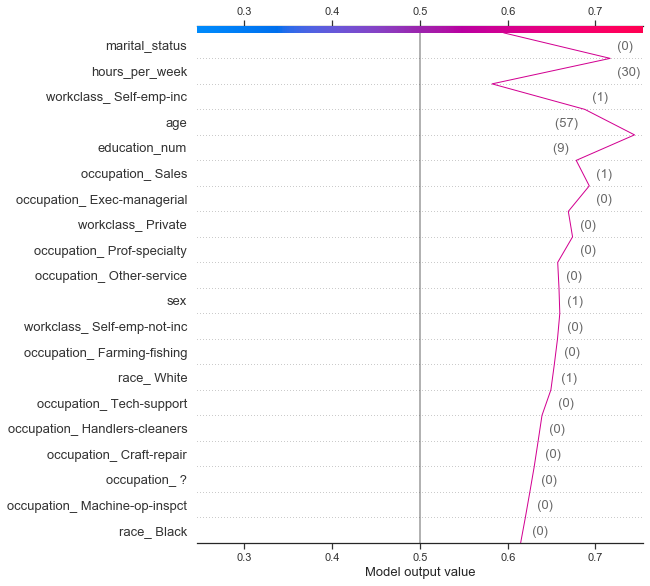

In [39]:
shap.decision_plot(base_value = explainer.expected_value[pred], shap_values=shap_values[pred][row], features = X_test.iloc[row], feature_names=X_test.columns.tolist(),
                link='identity', new_base_value=0.5)

In [20]:
exp = lime_explainer.explain_instance(X_test.iloc[row], rf.predict_proba, num_features=5)

exp.show_in_notebook(show_table=True)

# LIME experiments with different parameters

In [28]:
# Creating the Lime Explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                        training_labels = y_train.values,
                                                   feature_names=X_train.columns.tolist(), 
                                                   class_names=['>50k, <50k'], 
                                                  discretize_continuous=True,
                                                       discretizer='quartile')
exp = lime_explainer.explain_instance(X_test.iloc[row], rf.predict_proba, num_features=5)

exp.show_in_notebook(show_table=True)

In [29]:
# Creating the Lime Explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                        training_labels = y_train.values,
                                                   feature_names=X_train.columns.tolist(), 
                                                   class_names=['>50k', '<50k'], 
                                                  discretize_continuous=True,
                                                       discretizer='decile')
exp = lime_explainer.explain_instance(X_test.iloc[row], rf.predict_proba, num_features=5)

exp.show_in_notebook(show_table=True)

In [30]:
# Creating the Lime Explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                        training_labels = y_train.values,
                                                   feature_names=X_train.columns.tolist(), 
                                                   class_names=['>50k, <50k'], 
                                                  discretize_continuous=False)
exp = lime_explainer.explain_instance(X_test.iloc[row], rf.predict_proba, num_features=5)

exp.show_in_notebook(show_table=True)

## SP-LIME

In [297]:
from lime import submodular_pick
sp_obj = submodular_pick.SubmodularPick(lime_explainer, X_train.values, rf.predict_proba, sample_size=500, num_features=10, num_exps_desired=5)

In [367]:
exp = sp_obj.sp_explanations[0]

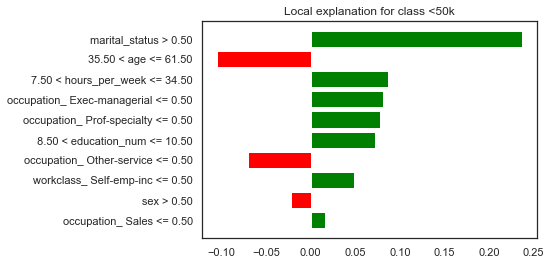

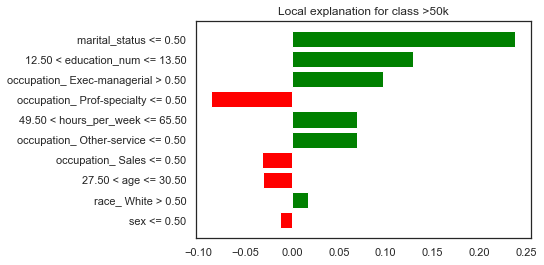

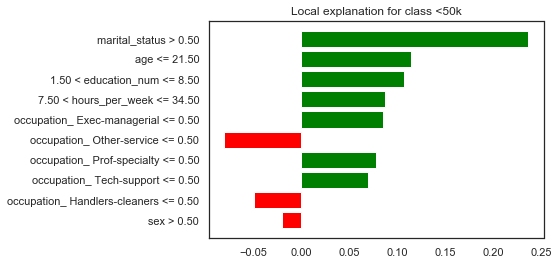

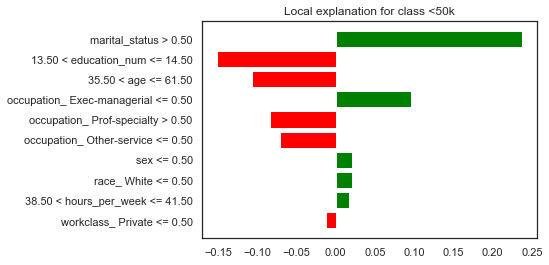

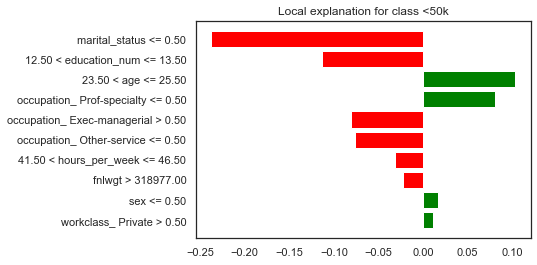

In [298]:
[exp.as_pyplot_figure(label=exp.available_labels()[0]) for exp in sp_obj.sp_explanations];

In [371]:
exp.score

0.6176380907655776

In [350]:
W_pick=pd.DataFrame([dict(this.as_list(this.available_labels()[0])) for this in sp_obj.sp_explanations]).fillna(0)

W_pick['prediction'] = [this.available_labels()[0] for this in sp_obj.sp_explanations]

In [351]:
grped_coeff = W_pick.groupby('prediction').mean()

grped_coeff = grped_coeff.T.fillna(0)
grped_coeff['abs'] = np.abs(grped_coeff.iloc[:,0])
grped_coeff.sort_values('abs', inplace=True, ascending=True)
grped_coeff.drop('abs',axis=1,inplace=True)

In [352]:
np.abs(W_pick.drop('prediction',axis=1)).mean(axis=0).sort_values(ascending=True).iplot(kind='barh')

In [314]:
grped_coeff.fillna(0).iplot(kind='barh',bargap=.5)

In [398]:
W=pd.DataFrame([dict(this.as_list(this.available_labels()[0])) for this in sp_obj.explanations]).fillna(0)

W['prediction'] = [this.available_labels()[0] for this in sp_obj.explanations]

In [404]:
np.abs(W.drop('prediction',axis=1)).mean(axis=0).sort_values(ascending=False).head(25).sort_values(ascending=True).iplot(kind='barh')

In [412]:
grped_coeff = W.groupby('prediction').mean()

grped_coeff = grped_coeff.T
grped_coeff['abs'] = np.abs(grped_coeff.iloc[:,0])
grped_coeff.sort_values('abs', inplace=True, ascending=False)
grped_coeff.head(25).sort_values('abs', ascending=True).drop('abs',axis=1).iplot(kind='barh',bargap=.5)

In [414]:
sex_le.classes_

array([' Female', ' Male'], dtype=object)

In [349]:
le.classes_

array([' <=50K', ' >50K'], dtype=object)

In [383]:
age_investigation = W[W['age > 61.50']>0]

In [387]:
row = 0
age_investigation.iloc[row][age_investigation.iloc[row]>0].sort_values()

sex > 0.50                           0.020288
age > 61.50                          0.043962
occupation_ Prof-specialty > 0.50    0.078890
occupation_ Other-service <= 0.50    0.080289
12.50 < education_num <= 13.50       0.120590
marital_status <= 0.50               0.242879
prediction                           1.000000
Name: 280, dtype: float64

In [388]:
row = 1
age_investigation.iloc[row][age_investigation.iloc[row]>0].sort_values()

sex > 0.50                               0.013646
age > 61.50                              0.047028
occupation_ Handlers-cleaners <= 0.50    0.050783
occupation_ Prof-specialty > 0.50        0.078159
occupation_ Other-service <= 0.50        0.079954
education_num > 14.50                    0.198483
marital_status <= 0.50                   0.237944
prediction                               1.000000
Name: 285, dtype: float64

In [389]:
row = 2
age_investigation.iloc[row][age_investigation.iloc[row]>0].sort_values()

workclass_ Private <= 0.50            0.014129
race_ White > 0.50                    0.017465
sex > 0.50                            0.017954
age > 61.50                           0.046066
occupation_ Other-service <= 0.50     0.070571
occupation_ Exec-managerial > 0.50    0.078353
49.50 < hours_per_week <= 65.50       0.079438
education_num > 14.50                 0.206085
marital_status <= 0.50                0.238694
prediction                            1.000000
Name: 414, dtype: float64

In [390]:
row = 3
age_investigation.iloc[row][age_investigation.iloc[row]>0].sort_values()

sex > 0.50                            0.017089
age > 61.50                           0.056946
workclass_ Self-emp-inc > 0.50        0.061397
occupation_ Other-service <= 0.50     0.077955
occupation_ Exec-managerial > 0.50    0.083670
marital_status <= 0.50                0.239187
prediction                            1.000000
Name: 471, dtype: float64

# PDP

In [18]:
from pdpbox import pdp, info_plots

In [19]:
X_train.columns.tolist()

['age',
 'fnlwgt',
 'education_num',
 'marital_status',
 'sex',
 'hours_per_week',
 'workclass_ ?',
 'workclass_ Federal-gov',
 'workclass_ Local-gov',
 'workclass_ Never-worked',
 'workclass_ Private',
 'workclass_ Self-emp-inc',
 'workclass_ Self-emp-not-inc',
 'workclass_ State-gov',
 'workclass_ Without-pay',
 'occupation_ ?',
 'occupation_ Adm-clerical',
 'occupation_ Armed-Forces',
 'occupation_ Craft-repair',
 'occupation_ Exec-managerial',
 'occupation_ Farming-fishing',
 'occupation_ Handlers-cleaners',
 'occupation_ Machine-op-inspct',
 'occupation_ Other-service',
 'occupation_ Priv-house-serv',
 'occupation_ Prof-specialty',
 'occupation_ Protective-serv',
 'occupation_ Sales',
 'occupation_ Tech-support',
 'occupation_ Transport-moving',
 'race_ Amer-Indian-Eskimo',
 'race_ Asian-Pac-Islander',
 'race_ Black',
 'race_ Other',
 'race_ White',
 'random']

In [20]:
pdp_age = pdp.pdp_isolate(
    model=rf, dataset=X_train, model_features=X_train.columns, feature='age'
)

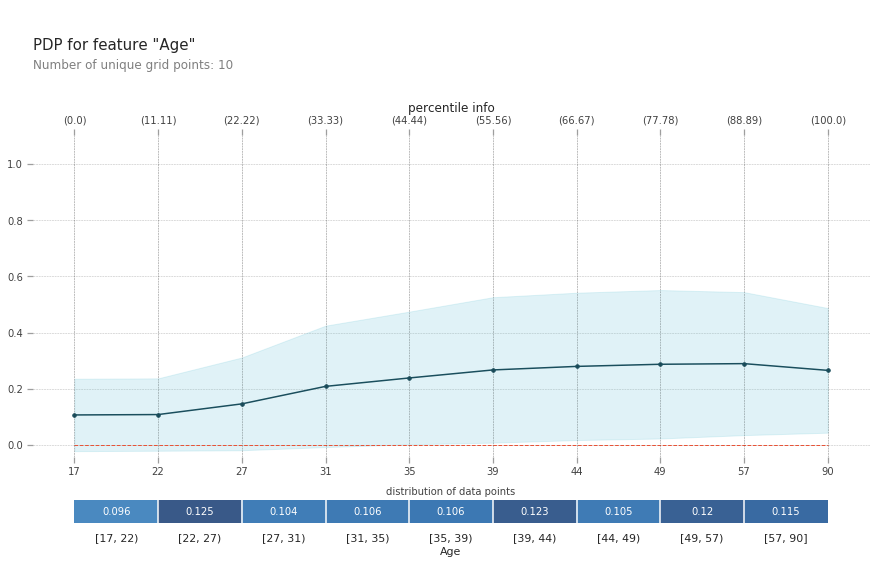

In [52]:
# more info
fig, axes = pdp.pdp_plot(pdp_age, 'Age', plot_lines=False, center=False, frac_to_plot=0.5, plot_pts_dist=True,x_quantile=True, show_percentile=True)

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


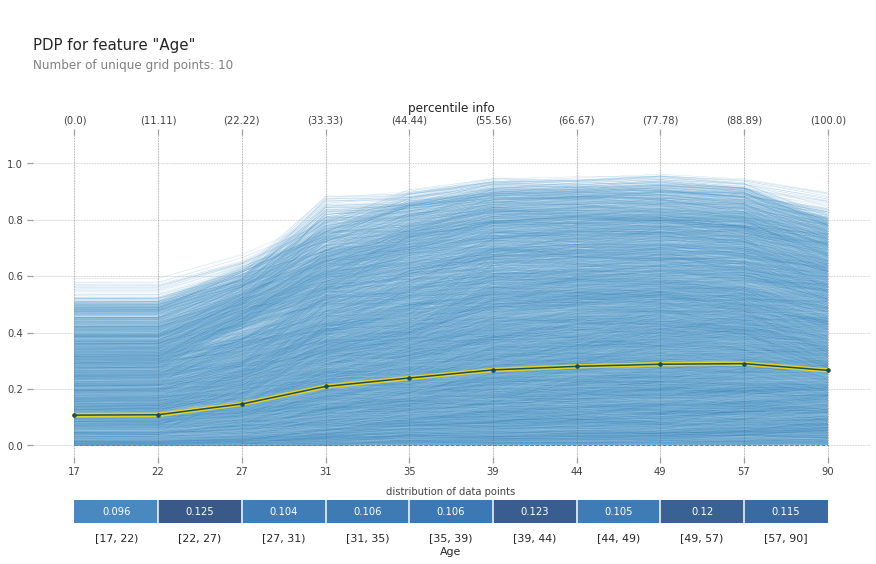

In [21]:
# more info
fig, axes = pdp.pdp_plot(pdp_age, 'Age', plot_lines=True, center=False, frac_to_plot=0.5, plot_pts_dist=True,x_quantile=True, show_percentile=True)

In [53]:
pdp_fnl = pdp.pdp_isolate(
    model=rf, dataset=X_train, model_features=X_train.columns, feature='fnlwgt'
)

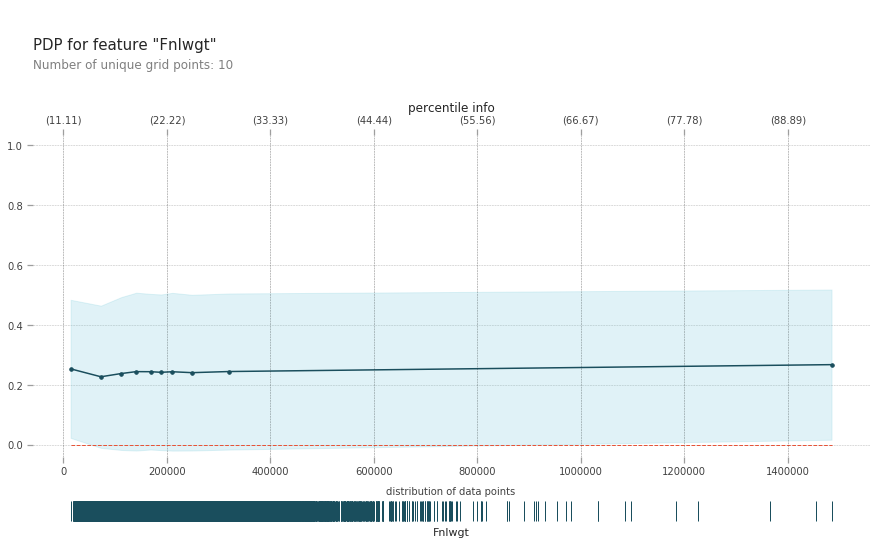

In [57]:
# more info
fig, axes = pdp.pdp_plot(pdp_fnl, 'Fnlwgt', plot_lines=False, center=False, plot_pts_dist=True, show_percentile=True)

In [58]:
pdp_rdm = pdp.pdp_isolate(
    model=rf, dataset=X_train, model_features=X_train.columns, feature='random'
)

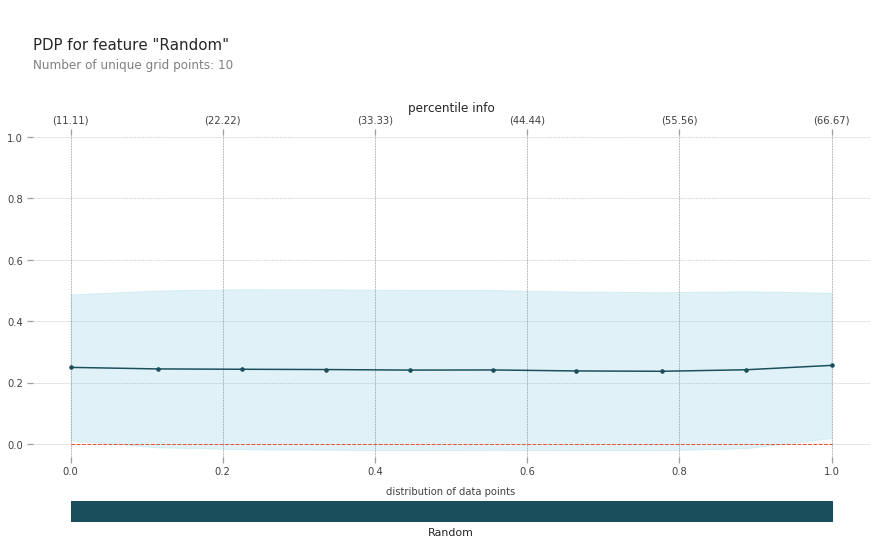

In [59]:
# more info
fig, axes = pdp.pdp_plot(pdp_rdm, 'Random', plot_lines=False, center=False, plot_pts_dist=True, show_percentile=True)

In [64]:
edu_map = edu_map.set_index('education_num').to_dict()['education']

In [100]:
pdp_edu = pdp.pdp_isolate(
    model=rf, dataset=X_train, model_features=X_train.columns, feature='education_num'
)

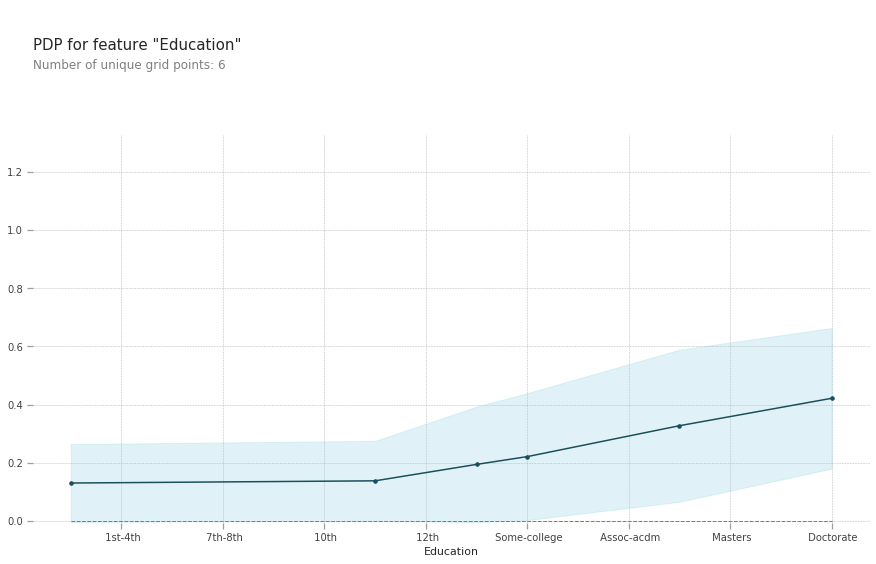

In [103]:
# more info
fig, axes = pdp.pdp_plot(pdp_edu, 'Education', plot_lines=False, center=False)
_ = axes['pdp_ax'].set_xticklabels([edu_map.get(col) for col in axes['pdp_ax'].get_xticks()])

In [22]:
occupation_features = ['occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occupation_ Sales', 'occupation_ Tech-support', 'occupation_ Transport-moving']
pdp_occupation = pdp.pdp_isolate(
    model=rf, dataset=X_train, model_features=X_train.columns, 
    feature=occupation_features
)

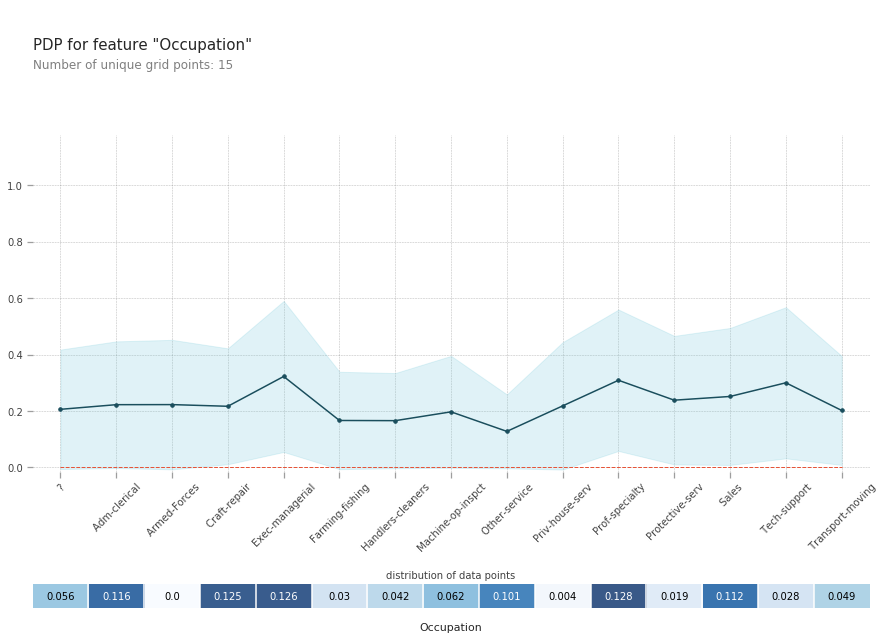

In [55]:
fig, axes = pdp.pdp_plot(pdp_occupation, 'Occupation', center = False, plot_pts_dist=True)
_ = axes['pdp_ax']['_pdp_ax'].set_xticklabels([col.replace("occupation_","") for col in occupation_features])
axes['pdp_ax']['_pdp_ax'].tick_params(axis='x', rotation=45)
bounds = axes['pdp_ax']['_count_ax'].get_position().bounds
axes['pdp_ax']['_count_ax'].set_position([bounds[0], 0, bounds[2], bounds[3]])
_ = axes['pdp_ax']['_count_ax'].set_xticklabels([])

In [122]:
pdp_marital = pdp.pdp_isolate(
    model=rf, dataset=X_train, model_features=X_train.columns, feature='marital_status'
)

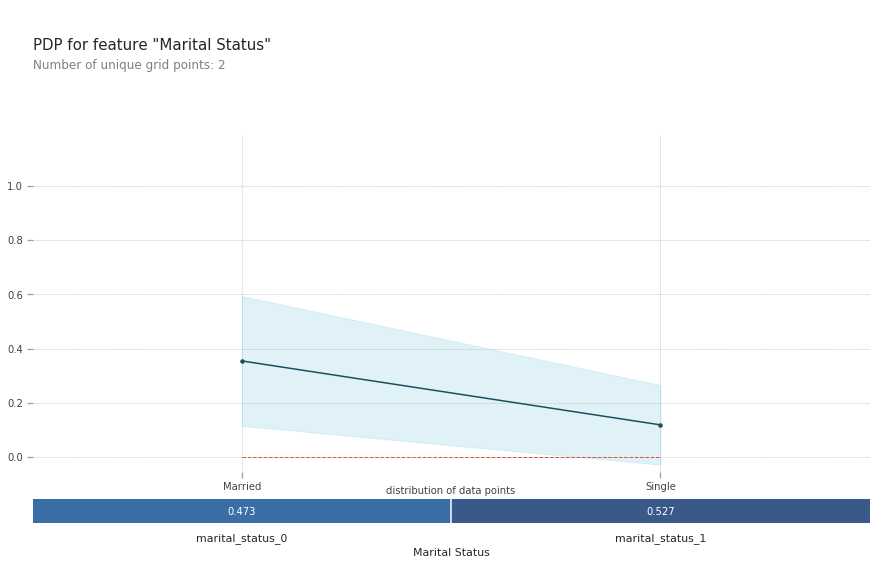

In [131]:
fig, axes = pdp.pdp_plot(pdp_marital, 'Marital Status', center=False, plot_pts_dist=True)
_ = axes['pdp_ax']['_pdp_ax'].set_xticklabels(marital_le.inverse_transform(axes['pdp_ax']['_pdp_ax'].get_xticks()))

In [25]:
pdp_sex = pdp.pdp_isolate(
    model=rf, dataset=X_train, model_features=X_train.columns, feature='sex'
)

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


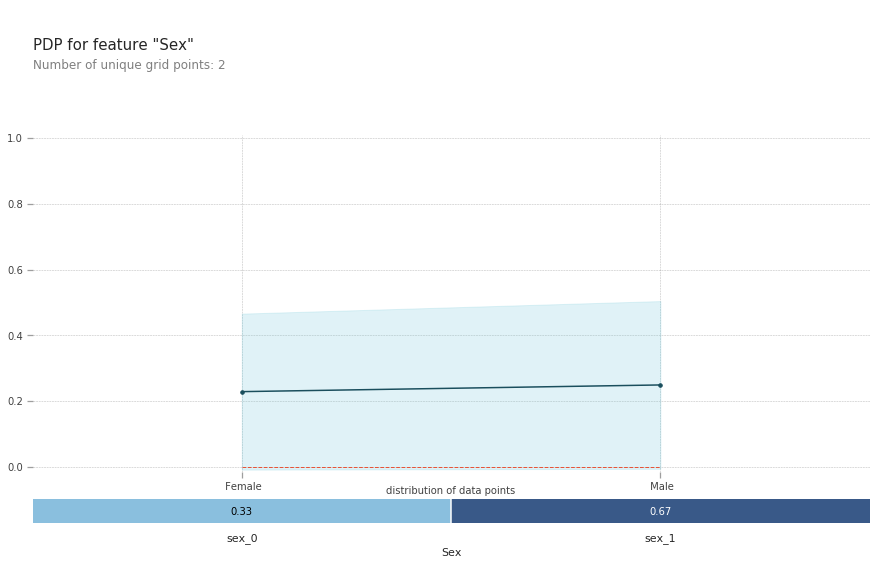

In [26]:
fig, axes = pdp.pdp_plot(pdp_sex, 'Sex', center=False, plot_pts_dist=True)
_ = axes['pdp_ax']['_pdp_ax'].set_xticklabels(sex_le.inverse_transform(axes['pdp_ax']['_pdp_ax'].get_xticks()))

In [69]:
inter1 = pdp.pdp_interact(
    model=rf, dataset=X_train, model_features=X_train.columns, features=['age', 'education_num']
)

[Text(0, 0, ''),
 Text(0, 0, ' 1st-4th'),
 Text(0, 0, ' 7th-8th'),
 Text(0, 0, ' 10th'),
 Text(0, 0, ' 12th'),
 Text(0, 0, ' Some-college'),
 Text(0, 0, ' Assoc-acdm'),
 Text(0, 0, ' Masters'),
 Text(0, 0, ' Doctorate')]

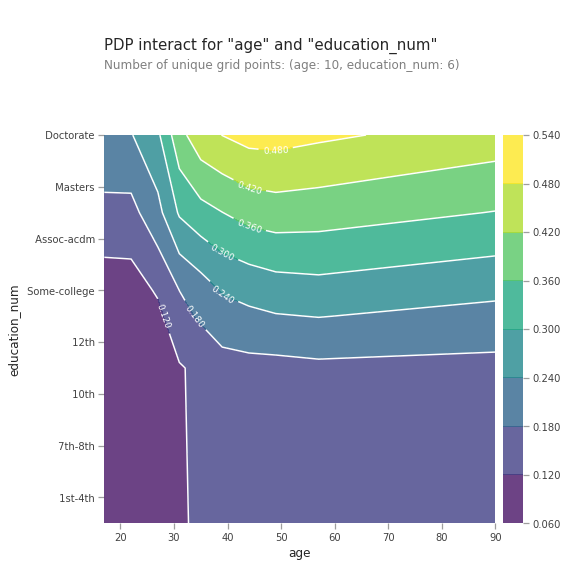

In [66]:
fig, axes = pdp.pdp_interact_plot(
    pdp_interact_out=inter1, feature_names=['age', 'education_num'], plot_type='contour', x_quantile=False, plot_pdp=False
)
axes['pdp_inter_ax'].set_yticklabels([edu_map.get(col) for col in axes['pdp_inter_ax'].get_yticks()])

In [70]:
inter1 = pdp.pdp_interact(
    model=rf, dataset=X_train, model_features=X_train.columns, features=['age', 'hours_per_week']
)

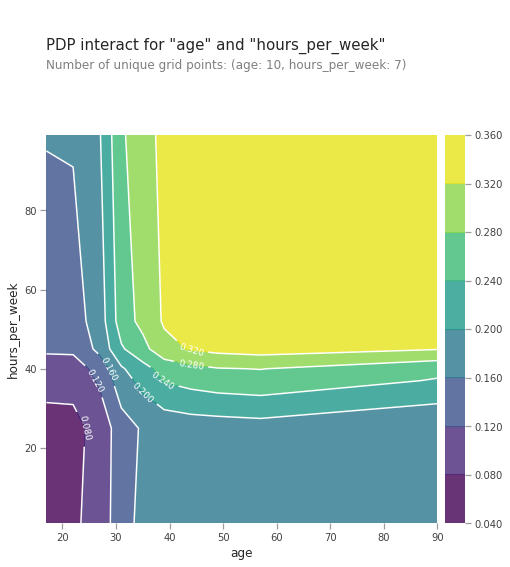

In [72]:
fig, axes = pdp.pdp_interact_plot(
    pdp_interact_out=inter1, feature_names=['age', 'hours_per_week'], plot_type='contour', x_quantile=False, plot_pdp=False
)

In [74]:
inter1 = pdp.pdp_interact(
    model=rf, dataset=X_train, model_features=X_train.columns, features=['age', 'fnlwgt']
)

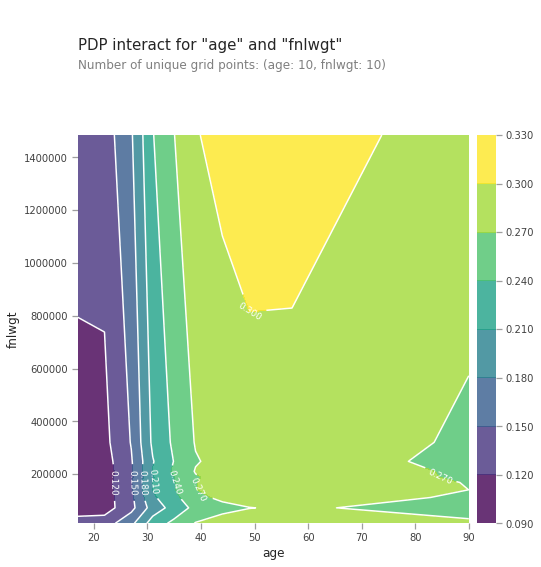

In [75]:
fig, axes = pdp.pdp_interact_plot(
    pdp_interact_out=inter1, feature_names=['age', 'fnlwgt'], plot_type='contour', x_quantile=False, plot_pdp=False
)

In [ ]:
inter1 = pdp.pdp_interact(
    model=rf, dataset=X_train, model_features=X_train.columns, features=['marital_status', 'sex']
)

[Text(0, 0, ' Female'), Text(0, 0, ' Male')]

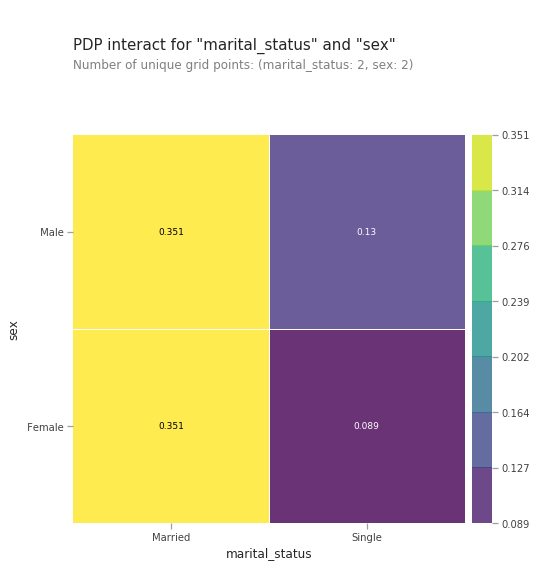

In [24]:
fig, axes = pdp.pdp_interact_plot(
    pdp_interact_out=inter1, feature_names=['marital_status', 'sex'], plot_type='grid', x_quantile=False, plot_pdp=False
)
axes['pdp_inter_ax'].set_xticklabels(marital_le.inverse_transform(axes['pdp_inter_ax'].get_xticks()))
axes['pdp_inter_ax'].set_yticklabels(sex_le.inverse_transform(axes['pdp_inter_ax'].get_yticks()))

# ALE

In [10]:
from ale import ale_plot

In [47]:
X_train.columns.tolist()

['age',
 'fnlwgt',
 'education_num',
 'marital_status',
 'sex',
 'hours_per_week',
 'workclass_ ?',
 'workclass_ Federal-gov',
 'workclass_ Local-gov',
 'workclass_ Never-worked',
 'workclass_ Private',
 'workclass_ Self-emp-inc',
 'workclass_ Self-emp-not-inc',
 'workclass_ State-gov',
 'workclass_ Without-pay',
 'occupation_ ?',
 'occupation_ Adm-clerical',
 'occupation_ Armed-Forces',
 'occupation_ Craft-repair',
 'occupation_ Exec-managerial',
 'occupation_ Farming-fishing',
 'occupation_ Handlers-cleaners',
 'occupation_ Machine-op-inspct',
 'occupation_ Other-service',
 'occupation_ Priv-house-serv',
 'occupation_ Prof-specialty',
 'occupation_ Protective-serv',
 'occupation_ Sales',
 'occupation_ Tech-support',
 'occupation_ Transport-moving',
 'race_ Amer-Indian-Eskimo',
 'race_ Asian-Pac-Islander',
 'race_ Black',
 'race_ Other',
 'race_ White',
 'random']

Quantiles : [17. 22. 26. 30. 33. 37. 41. 45. 50. 58. 90.]


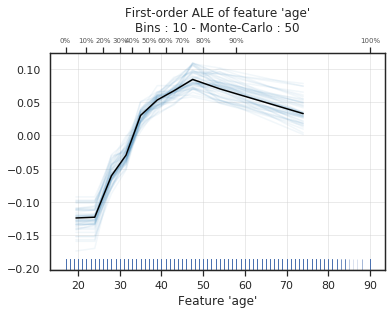

In [11]:
ale_plot(rf, X_train, 'age', monte_carlo=True)

Quantiles : [ 1.  7.  9.  9.  9. 10. 10. 11. 13. 13. 16.]


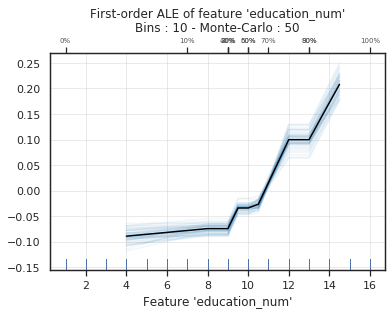

In [14]:
ale_plot(rf, X_train, 'education_num', monte_carlo=True)